In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.optimize import curve_fit

In [2]:
# Make the plots a bit bigger to see
# NOTE: Must be done in a separate cell
plt.rcParams['figure.dpi'] = 100

In [3]:
# path1 = "../../../../../../Volumes/Kunal_EHD/Work/Codes/RS_data_122920/par_set_2_cbc/vrun2_d1_40/"
path1 = "../NoneqTrans2/Data_test/vrun2_d1_40/sample/"
Nsamp = 2048
E = 6.3
maxdist = 63

In [4]:
#### Voltage Domain plots : Temporal Snapshots 
rows = 32
columns = 10
fig=plt.figure(figsize=(100, 320))

for t in range(320):
#     if i%16 == 0:    
    globals()["phi_" + str(t)] = np.loadtxt(path1 + "phi_val_"+ format(E, '.2f')+ "_" +str(t)+"_.dat")
    fig.add_subplot(rows, columns, (t+1))
    plt.imshow(np.transpose((globals()["phi_" + str(t)])**2),cmap='rainbow')
    plt.title("E = "+format(E, '.2f'), fontsize = 60 )
#     fluc1[i] = np.var(np.transpose((globals()["phi_" + str(i)])**2))
#     plt.xlabel("m_x")
#     plt.ylabel("m_y")
# plt.legend()

# plt.savefig(path2 + "Dist_time_Tbath=0.85Tc_E=23.10.pdf")

plt.show()




In [5]:
#### Corelations along Y ####
def pair_corY(phi,a):
    nx,ny = np.shape(phi)
    gx = np.zeros(nx)
    for i in range(nx):
        gg = 0
        for j in range(ny):
            if j < (ny-a):
                gg += phi[i,(j+a)]*phi[i,j]
        gx[i] = gg/(ny-a)
    return np.mean(gx)
    

#### Correlations along X ####
def pair_corX(phi,a):
    nx,ny = np.shape(phi)
    gy = np.zeros(ny)
    for j in range(ny):
        gg = 0
        for i in range(nx):
            if i < (nx-a):
                gg += phi[(i+a),j]*phi[i,j]
        gy[j] = gg/(nx)
    return np.mean(gy)





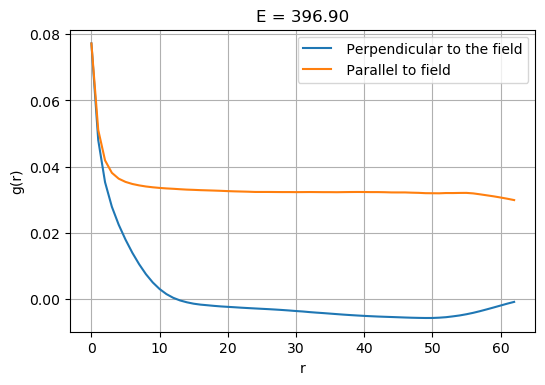

In [6]:
maxdist = 63
Gx_ = np.zeros((Nsamp,maxdist))
Gy_ = np.zeros((Nsamp,maxdist))


for l in range(Nsamp):
    phi = np.loadtxt(path1 + "phi_val_"+ format(E, '.2f')+ "_"+ str(l)+ "_.dat")
    dphi = phi - np.mean(phi)
    gofrx = []
    gofry = []
    dist = 0
    for dist in range(maxdist):
        gg = pair_corX(dphi,dist)
        gofrx.append(gg)
    dist = 0    
    for dist in range(maxdist):
        gg = pair_corY(dphi,dist)
        gofry.append(gg)
    Gx_[l,:] = gofrx[:]
    Gy_[l,:] = gofry[:]
    
x_ax = np.arange(0,maxdist)
G_x = np.mean(Gx_,axis = 0)
G_y = np.mean(Gy_,axis = 0)
plt.plot(x_ax,G_x, label = " Perpendicular to the field")
plt.plot(x_ax,G_y, label = " Parallel to field")
plt.ylabel("g(r)")
plt.xlabel("r")
plt.title("E = "+ format(E*63.,'.2f'))
plt.grid(b=True,which='major', axis='both')
plt.legend()
#     plt.savefig(path1 + "corr_n_"+str(n)+"_.pdf")
# plt.savefig(path2 + "gofr_Vt_"+format(E*63.,'.2f')+"_cbc.pdf",bbox_inches='tight')
plt.show()